<a href="https://colab.research.google.com/github/drSever/drSever_data_science/blob/main/Learning_projects_dl/project_7/project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Сегментация космических аппаратов

<image src="https://lms-cdn.skillfactory.ru/assets/courseware/v1/593219dc1be8afbe4e83c53ebedec797/asset-v1:SkillFactory+DSPR-CV+ALWAYS+type@asset+block/cv_project3_1_1.png">

# Задача

В современном мире космические технологии играют жизненно важную роль во многих отраслях: коммуникация, навигация и метеорология являются яркими тому примерами. Благодаря развитию компьютерного зрения и методов машинного обучения в космической отрасли был развёрнут широкий спектр приложений на основе машинного обучения, таких как система самонавигации для предотвращения столкновений искусственных космических объектов, мониторинг состояния космических аппаратов и т. д.

Обнаружение объектов и сегментация изображений являются необходимыми подзадачами для решения таких глобальных задач, как стыковка и обслуживание космических объектов, а также удаление мусора с орбиты. Сейчас у вас есть шанс окунуться в загадочную космическую индустрию и применить накопленные знания в сфере компьютерного зрения. Приступим!

Вы — специалист по CV в стартапе, и вам поручено построить модель предсказания траектории движения действующих космических объектов с целью избежать их столкновения с космическим мусором.

**Ваша задача** — произвести сегментацию изображений искусственных спутников и космических станций, достигнув значения метрики mIoU > 70 % на валидационной выборке.


ПРИМЕР ИЗОБРАЖЕНИЯ:

<image src="https://lms-cdn.skillfactory.ru/assets/courseware/v1/d149bd32545b0cd5e3abcce2d9b4b411/asset-v1:SkillFactory+DSPR-CV+ALWAYS+type@asset+block/cv_project3_2_1.png" width="400">

ПРИМЕР ТОГО, ЧТО МЫ ХОТИМ ПОЛУЧИТЬ:

<image src="https://lms-cdn.skillfactory.ru/assets/courseware/v1/43049972614bdcfa27b2bcfec7113aab/asset-v1:SkillFactory+DSPR-CV+ALWAYS+type@asset+block/cv_project3_2_2.png" width="400">

Для обучения вам предлагается использовать появившийся в июне 2021 года [набор данных](https://github.com/Yurushia1998/SatelliteDataset) "A Spacecraft Dataset for Detection, Segmentation and Parts Recognition"

→ Данный датасет состоит из 3 116 изображений и масок как синтезированных, так и реальных изображений спутников и космических станций (размер масок — 1 280x720).

→ Каждый космический аппарат разделён максимум на три части, включая корпус, солнечную панель и антенну, помеченные, соответственно, тремя цветами — зелёным, красным и синим.

→ В папке images находятся изображения, в папке mask — маски объектов.

→ Изображение с индексом 0-1002 имеет точную маску, а изображения с индексом 1003-3116 — грубую маску.

→ Наборы данных разделены на две части: обучающую выборку, включая 403 точные маски из индексов 0-402, и 2 114 грубых масок из индекса 1003-3116.

→ Набор данных val включает 600 изображений с точной маской, проиндексированных от 403 до 1002.

# Решение

Проект будет выполняться на платформе Google Colab Pro.

## Загрузка и установка необходимых модулей и библиотек

In [1]:
%%capture
!apt-get install tree

In [2]:
!pip -q install pytorch_lightning

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 801.6/801.6 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 26.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 37.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━

In [3]:
import os
from pathlib import Path
import tree
from google.colab import drive
import random
from tqdm.auto import tqdm
import ast

import pandas as pd
import numpy as np

import colorsys

import cv2
import albumentations as A

import torch
import torchvision.transforms.functional as F
import torchvision
import torch.nn.functional as nnF
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from albumentations.pytorch.transforms import ToTensorV2
#from torchvision.ops import masks_to_boxes
from torchvision.io import read_image
from torchvision.utils import draw_segmentation_masks

import pytorch_lightning as pl
from pytorch_lightning.callbacks import (
    EarlyStopping,
    LearningRateMonitor,
    ModelCheckpoint,
)

import matplotlib.pyplot as plt

In [ ]:
# настройка визуализации
%matplotlib inline
plt.style.use('seaborn-v0_8')
%config InlineBackend.figure_format = "retina"

## Загрузка данных

In [ ]:
# подключаем Google Drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# распаковывваем датасет
!unzip -q /content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_3/Data.zip

In [ ]:
# выведем структуру датасета
ROOT = 'Data/'
!ls {ROOT}/*.*
!tree -d {ROOT}

Data//all_bbox.txt  Data//ReadMe.txt
Data/
├── images
│   ├── train
│   └── val
└── mask
    ├── train
    └── val

6 directories


## EDA

Посмотрим совпадает ли количество файлов и количество масок:

In [ ]:
!find /content/Data/images/train/ -type f | wc -l
!find /content/Data/images/val/ -type f | wc -l
!find /content/Data/mask//train/ -type f | wc -l
!find /content/Data/mask/val/ -type f | wc -l

1914
533
2517
600


Получим BBoxes:

In [ ]:
with open(ROOT + 'all_bbox.txt') as f:
    bboxes_txt = f.read()

In [ ]:
bboxes_dict = ast.literal_eval(bboxes_txt) # вытащим словарь из строки
list(bboxes_dict.items())[:10] # выведем 10 ключей:значений

[('1003', [[1142.0, 547.0, 296.0, 135.0]]),
 ('1004',
  [[728.0, 198.0, 542.0, 59.0],
   [212.0, 305.0, 0.0, 118.0],
   [1279.0, 437.0, 768.0, 85.0]]),
 ('1005', [[1214.0, 582.0, 322.0, 32.0]]),
 ('1006', [[1268.0, 685.0, 77.0, 30.0]]),
 ('1007', [[1194.0, 602.0, 107.0, 90.0]]),
 ('1008', [[1279.0, 517.0, 7.0, 179.0]]),
 ('1009', [[1057.0, 539.0, 144.0, 128.0]]),
 ('1010', [[1258.0, 651.0, 14.0, 41.0]]),
 ('1011', [[1087.0, 719.0, 221.0, 0.0]]),
 ('1012', [[1017.0, 530.0, 292.0, 195.0]])]

In [ ]:
# количество ключей в словаре
len(bboxes_dict)

3117

Напишем функции для визуализации изображений и масок:

In [ ]:
def plot_image_masks(path_img, path_mask, idx):
    """
    Функция принимает на вход
      путь к файлам изображений,
      путь к файлам масок,
      номер изображения/маски (находится в названии файла) и
    визуализирует изображение с ограничивающей рамкой и его маску,
    возвращает и выводит название файла и bboxes.
    """
    fontsize = 16 # размер шрифта подписи

    file_img = 'img_resize_' + str(idx) + '.png' # собираем имя файла изображения
    mask_name = file_img.replace('.png', '_mask.png') # собираем имя файла маски

    bboxes = bboxes_dict[str(idx)] # получаем bboxes из словаря (получен выше)

    image = cv2.imread(f'{path_img}/{file_img}') # читаем файл изображения
    mask = cv2.imread(f'{path_mask}/{mask_name}') # читаем файл маски

    # переводим в RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

    # вытаскиваем box и обозначаем его на изображении
    for box in bboxes:
        box = np.array(box, dtype=int)
        image = cv2.rectangle(image, ((box[2]), box[3]), (box[0], box[1]), (255, 0, 0), thickness=4)

    # визуализируем изображение с bboxes и его маску
    f, ax = plt.subplots(1, 2, figsize=(10, 10))
    ax[0].imshow(image)
    ax[0].set_title('Original image', fontsize=fontsize)
    ax[0].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    ax[1].imshow(mask)
    ax[1].set_title('Original mask', fontsize=fontsize)
    ax[1].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    return mask_name, bboxes

In [ ]:
def plot_image_with_masks(path_img, path_mask, idx):
    """
    Функция принимает на вход
      путь к файлам изображений,
      путь к файлам масок,
      номер изображения/маски (находится в названии файла).
    Функция выводит изображение с наложенными на него масками.
    Количество полученных изображений = количеству обозначенных на изображении уникальных объектов.
    """

    """
    Примечание.
    В нашем случае файл маски представляет собой изображение RGB разрешением 1280х720.
    Каждый слой 2-хмерных матриц изображения RGB содержит пиксели значения которых 0 либо 255,
    что и формирует цвета масок (маски не пересекаются): зеленый (корпус), красный (солнечные панели) и синий (антены).
    Поэтому мы имеем 4 класса: background (0), корпус (255), панели(255), антены(255),
    которые складываясь и не пересекаясь (за исключением фона) на итоговом RGB-изображении
    дают 4 цвета (если маски есть для всех объектов).
    """

    # читаем изображение и его маску
    img = read_image(os.path.join(path_img, "img_resize_"+ str(idx) + ".png"))
    mask = read_image(os.path.join(path_mask, "img_resize_"+ str(idx) + "_mask.png"))

    # берем каждый слой 2-хмерных матриц маски
    for i in range(3):
        if len(torch.unique(mask[i,:,:])) == 1: # если на слое нет маски объекта (только фон = 0)
            mask = np.delete(mask,(i), axis=0) # то удаляем слой

    # получаем уникальные объекты из маски (но в нашем случае их 2, т.к. объект кодируется только 255)
    obj_ids = torch.unique(mask)
    # убираем фон
    obj_ids = obj_ids[1:]

    # разбивает цветокодированную маску на набор булевых масок
    # примечание: это работает для int и float
    masks = mask == obj_ids[:, None, None]

    # получаем изображение с наложенными на него масками (число таких изображений = числу объектов/масок)
    drawn_masks = []
    for mask in masks:
        drawn_masks.append(draw_segmentation_masks(img, mask, alpha=0.8, colors="blue"))

    # визуализируем полученные изображения с масками
    fig, axs = plt.subplots(ncols=len(drawn_masks), squeeze=False, figsize=(len(drawn_masks)*5, 5 ))
    for i, img in enumerate(drawn_masks):
        img = img.detach() # получаем тензор (копию)
        img = F.to_pil_image(img) # конвертируем в PIL Image
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

Визуализируем некоторые изображения и отдельно их маски:

('img_resize_1003_mask.png', [[1142.0, 547.0, 296.0, 135.0]])

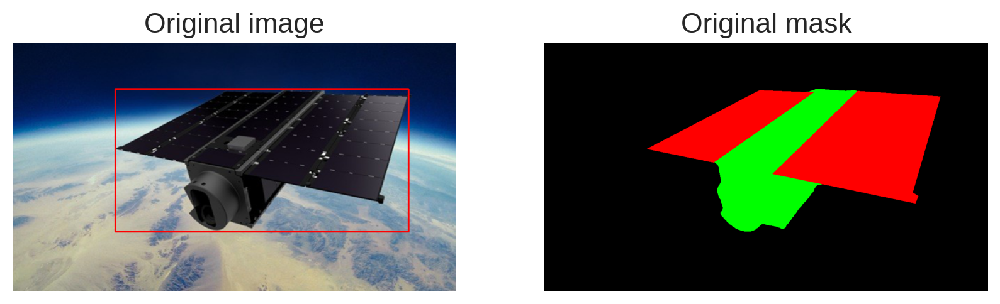

In [ ]:
path_img = ROOT + 'images/train/'
path_mask = ROOT + 'mask/train/'
plot_image_masks(path_img, path_mask, 1003)

('img_resize_1004_mask.png',
 [[728.0, 198.0, 542.0, 59.0],
  [212.0, 305.0, 0.0, 118.0],
  [1279.0, 437.0, 768.0, 85.0]])

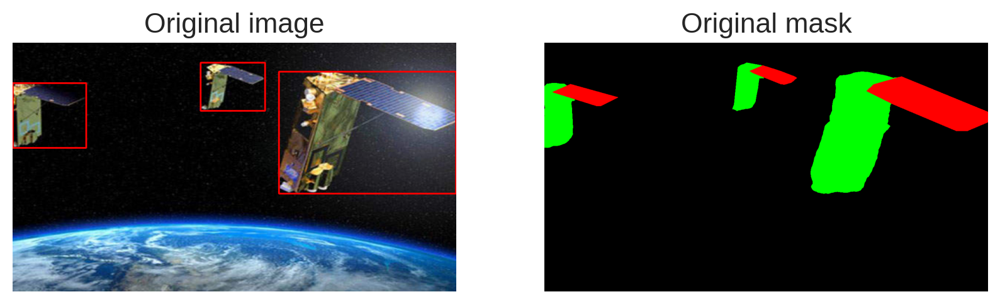

In [ ]:
plot_image_masks(path_img, path_mask, 1004)

('img_resize_360_mask.png', [[1251, 719, 144, 2]])

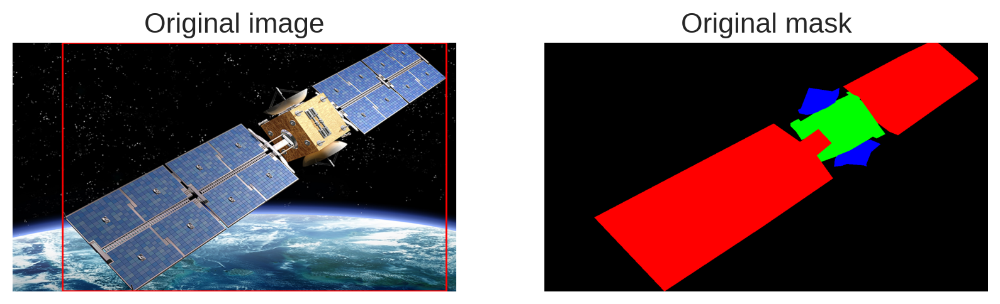

In [ ]:
plot_image_masks(path_img, path_mask, 360)

Визуализируем некоторые изображения с наложенными масками:

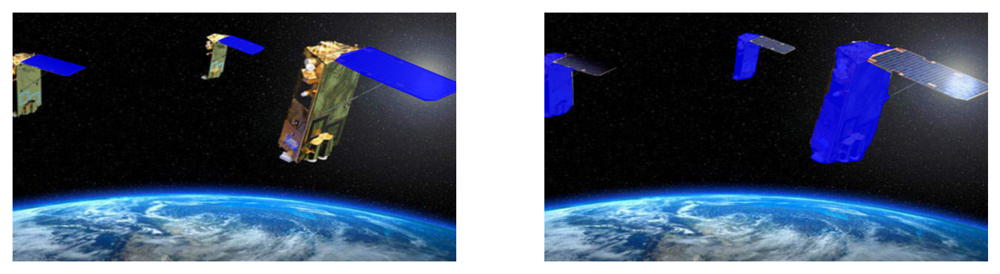

In [ ]:
plot_image_with_masks(path_img, path_mask, 1004)

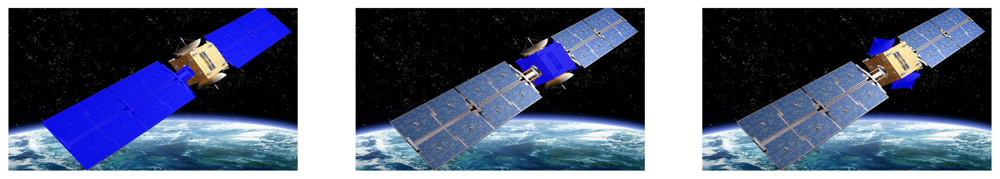

In [ ]:
plot_image_with_masks(path_img, path_mask, 360)

**Выводы:**
- датасет содержит 2447 файлов изображений (train + val) и 3117 масок (train + val), ключей в полученном словаре bboxes также 3117
- число файлов изображений и файлов масок не совпадают в обеих выборках
- одно изображение может содержать несколько космических станций и, соответственно, несколько bbox
- действительно, как указывалось в задании, изображения с индексом >=1003 не полностью размеченные

## Поиск решения

Нам предоставлены ограничивающие рамки для станций внутри которых необходимо сегментировать объекты станции.    
Не на всех изображениях все объекты качественно размечены.   
И по условию задания нам необходимо применить Instance Segmentation.

Можно попробовать вручную доразметить объекты станций, но это долго.   
Можно попробовать разделить маски (например, каждую солнечную панель представить, как отдельный объект или корпуса нескольких станций на одном изображении представить как разные объекты) и для каждой разделенной маски создать bboxes и пропустить через maskrcnn_resnet50_fpn (например), как предлагал мой [коллега](https://colab.research.google.com/drive/1Izu8dKOU0Kxhhtq8co-6QCcmHeKIE_GR?usp=sharing#scrollTo=9tmgLId6FVC7) в своем решении, которое он выложил в чат Пачки.

Поиск в интернете привел меня к данной [статье](https://arxiv.org/pdf/2106.08186.pdf), где изучив раздел 5.2 Spacecraft instance segmentation, я решил попробовать в качестве Baseline использовать DeepLabV3-модель.

Есть пример ее реализации с использованием Pytorch Lightning на [Kaggle](https://www.kaggle.com/code/dkudryavtsev/spacecraft-component-segmentation) именно для нашего датасета.



## DeepLabV3

Документация к модели [здесь](https://pytorch.org/vision/main/models/deeplabv3.html).

Зададим свой класс Dataset:

In [ ]:
class SpacecraftDataset(Dataset):
    def __init__(self, transforms, split='train'):
        if split == 'train':
            # пути к изображениям и маскам тренировочной выборки
            self.image_path = Path(ROOT) / 'images/train/'
            self.mask_path = Path(ROOT) / 'mask/train/'
        else:
            # пути к изображениям и маскам валидационной выборки
            self.image_path = Path(ROOT) / 'images/val/'
            self.mask_path = Path(ROOT) / 'mask/val/'

        self.image_filenames = sorted(self.image_path.glob('*.png')) # сортируем файлы
        self.transform = transforms # трансформации (для каждой выборки свои)


    def __len__(self):
        return len(self.image_filenames)


    def __getitem__(self, idx):
        """
        Используем Try/except, т.к. количество изображений и масок не совпадает
        """
        try:
            # читаем изображение и переводим в RGB
            image_filename = self.image_filenames[idx]
            image = cv2.imread(str(image_filename))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # читаем маску и переводим в RGB
            mask_filename = ( # получаем название файла маски из названия файла изображения
                self.mask_path/
                    str(image_filename.name.split('.')[0] + '_mask.png'))
            if mask_filename.is_file():
                mask = cv2.imread(str(mask_filename))
                mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
            else:
                raise(IOError) # выводим ошибку, если файл маски отсутствует

            # Mask one-hot encoding: background + 3 класса
            mask[mask!=0] = 1 # пиксель маски объекта =1, пиксель фона =0
            foreground = np.ubyte(np.sum(mask, axis=2)) # маски сливаются в одну 2-хмерную матрицу
            background = foreground^1 # фон - зеркальное отображение матрицы соединенных масок
            background = background[:, :, np.newaxis] # добавляем 3-ю ось
            mask = (np.concatenate((background, mask), axis=2)
                    .astype(np.float32)) # к исходной маске добавляем фон, получая размерность (720, 1280, 4)

            # трансформации / аугментации изображений и их масок
            transformed = self.transform(image=image, mask=mask)
            image = transformed['image']
            mask = transformed['mask']

            mask = mask.permute(2, 0, 1)  # (H,W,C) -> (C,H,W) или height-width-channel -> channel-height-width
            return image, mask.to(torch.float32)

        except:
            # тогда переходим к следующему индексу
            if idx + 1 <= self.__len__():
                return self.__getitem__(idx + 1)
            else:
                raise StopIteration # если датасет закончился

Зададим трансформации:

In [ ]:
# трансформации для тренировочного датасета
train_transforms = A.Compose([
    A.HorizontalFlip(),
    A.VerticalFlip(),
    A.RandomCropFromBorders(), # Обрезка bbox из изображения с произвольным вырезанием частей из границ без изменения размера в конце
    A.OneOf([ ### будет отобрана 1 трансформация из списка с p=0.5 по умолчанию
        A.ColorJitter(hue=0.1), # Случайным образом изменяет яркость, контрастность и насыщенность изображения
        A.Equalize(by_channels=False), # выравнивает гистограмму изображения
        A.FancyPCA(), # дополняет RGB-изображение с помощью FancyPCA (см. Krizhevsky "ImageNet Classification with Deep Convolutional Neural Networks")
        A.GaussNoise(), # наложение гауссовского шума
        A.ImageCompression(), # Снижает качество изображения за счет сжатия изображения в форматах Jpeg, WebP
        A.RandomGamma(), # Применяет случайную гамма-коррекцию к изображению
        A.RandomToneCurve(), # Произвольно изменяйте соотношение между светлыми и темными участками изображения, манипулируя его тоновой кривой
        A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25), # Случайный сдвиг значений для каждого канала входного RGB-изображения
        A.AdvancedBlur(), # Размывает входное изображение с помощью фильтра Generalized Normal со случайно выбранными параметрами
        A.RandomBrightnessContrast(brightness_limit=[-0.3, 0.1]) # случайное изменение яркости и контрастности входного изображения.
    ]),
    A.Resize(520, 520),
    A.RandomRotate90(),
    A.Normalize(),
    ToTensorV2()
    ])

# трансформации для валидационного датасета
valid_transforms = A.Compose([
    A.Resize(520, 520),
    A.Normalize(),
    ToTensorV2()
])

Создадим датасеты:

In [ ]:
train_dataset = SpacecraftDataset(transforms=train_transforms)
valid_dataset = SpacecraftDataset(transforms=valid_transforms, split='val')

Проверим, что датасеты считываются нормально:

In [ ]:
for el in tqdm(train_dataset):
    pass
for el in tqdm(valid_dataset):
    pass

  0%|          | 0/1913 [00:00<?, ?it/s]

  0%|          | 0/532 [00:00<?, ?it/s]

In [ ]:
def normim_to_numpy(image, mask, size=(720, 1280)):
    """
    Функция принимает на вход изображение и его маску.
    Конвертирует нормализованное изображение и маску torch.Tensor в "H,W,C" массив целых чисел [0-255].
    Восстанавливает исходный размер изображения (1280x720)
    Возвращает изображение и маску в виде массивов (непрерывных массивов в памяти (порядок C))
    """
    # задаем трансформации (нормализация + ресайз)
    transform = A.Compose([
        A.Normalize(mean=[0., 0., 0.], std=[1/0.229, 1/0.224, 1/0.225 ],
                    max_pixel_value=1.),
        A.Normalize(mean=[-0.485, -0.456, -0.406], std=[ 1., 1., 1. ],
                    max_pixel_value=1.),
        A.Resize(*size)
    ])

    image = image.numpy().transpose((1, 2, 0)) # изображение в массив с заменой порядка осей
    mask = mask[1:,:,:].numpy().transpose((1, 2, 0)) # маску в массив с заменой порядка осей (без фона)

    # выполняем трансформации
    transformed = transform(image=image, mask=mask)
    image = transformed['image']
    mask = transformed['mask']

    # в 8-битные целые числа (от 0 до 255)
    image = (image * 255).astype(np.uint8)

    return np.ascontiguousarray(image), np.ascontiguousarray(mask)


def predict_mask(model, image):
    """
    Функция принимает на вход модель и изображение предсказывает
    маску изображения, которую и возвращает.
    """

    # модель в режим eval и переносим на cpu
    model.eval()
    model.to('cpu')

    # предсказываем логиты [C, H, W]
    with torch.no_grad():
        # + размерность в image, получаем результат предсказания, убираем размерность 0
        pred_mask = model(image.unsqueeze(0))['out'].squeeze(0)

    # предсказывваем уже маску (принадлежность каждого пикселя) [H, W]
    pred_mask = pred_mask.argmax(dim=0)

    # one-hot [H, W, C]
    pred_mask = torch.eye(4)[pred_mask.to(torch.int64)]

    # background (фон) убираем [H, W, 3 channels] == RGB image
    pred_mask = pred_mask[:,:,1:].numpy()

    transform = A.Resize(720, 1280) # задаем трансформацию (ресайз до оригинала)
    image = image.numpy().transpose((1, 2, 0)) # меняем оси как в маске
    pred_mask = transform(image=image, mask=pred_mask)['mask'] # итоговая маска

    return pred_mask


def display_random_examples(dataset, n=2, model=None):
    """
    Функция принимает на вход датасет и выводит несколько примеров изображений и
    их масок (по умолчанию 2 примера). Если указывается модель, то в каждом примере
    выводится изображение, маска, предсказаная маска.
    """
    if model is None:
        fig, ax = plt.subplots(nrows=n, ncols=2, figsize=(10, 3*n))
    else:
        fig, ax = plt.subplots(nrows=n, ncols=3, figsize=(15, 3*n))

    for i in range(n):
        im_tensor, mask_tensor = dataset.__getitem__(np.random.randint(len(dataset)))
        image, mask = normim_to_numpy(im_tensor, mask_tensor)

        ax[i, 0].imshow(image)
        ax[i, 1].imshow(image)
        ax[i, 1].imshow(mask, alpha=0.5)

        ax[i, 0].set_title('Image')
        ax[i, 1].set_title('Mask')

        if model is not None:
            ax[i, 2].imshow(image)
            ax[i, 2].imshow(
                predict_mask(model, im_tensor), alpha=0.5)
            ax[i, 2].set_title('Predicted mask')

    [axi.set_axis_off() for axi in ax.ravel()]
    plt.tight_layout()
    plt.show()

Выведем случайные изображения тренировочного датасета:

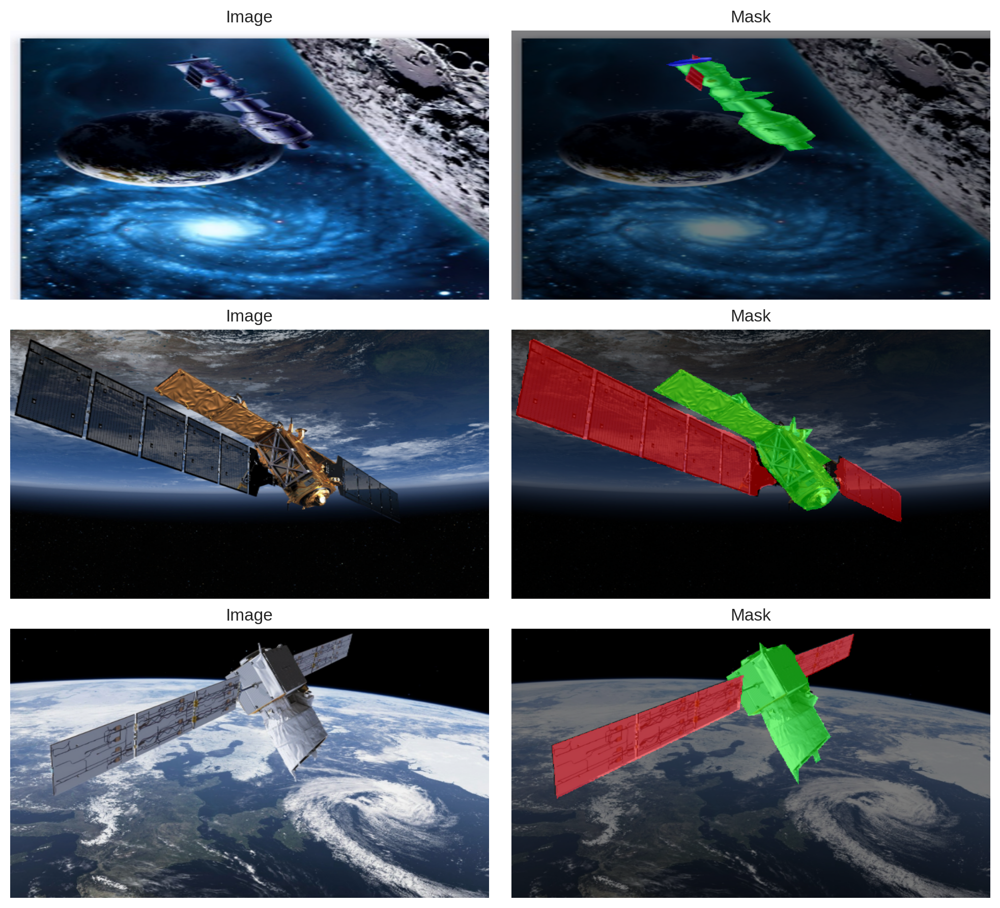

In [ ]:
display_random_examples(train_dataset, n=3)

Функция для расчета mIOU:

In [ ]:
def IoU(preds, targs, device="cuda", eps: float=1e-8):
    """Computes the Jaccard loss, a.k.a the IoU loss.
    Rewritten from https://github.com/kevinzakka/pytorch-goodies
        for one-hot-encoded masks (targs)

    Notes: [Batch size,Num classes,Height,Width]
    Args:
        targs: a tensor of shape [B, C, H, W]. C==0 is the background class
        preds: a tensor of shape [B, C, H, W]. Corresponds to
            the raw output or logits of the model. (prediction)
        eps: added to the denominator for numerical stability.
    Returns:
        iou: the average class intersection over union value
             for multi-class image segmentation
    """

    # Take softmax along class dimension;
    # all class probs add to 1 (per pixel)
    probas = nnF.softmax(preds, dim=1)

    targs = targs.type(preds.type()).to(device)

    # Sum probabilities by class and across batch images
    # Background class (dims==1) is excluded (dims==0 is for batch)
    dims = (0,) + tuple(range(2, targs.ndimension()))
    intersection = torch.sum(probas * targs, dims)  # [class0,class1,...]
    cardinality = torch.sum(probas + targs, dims)  # [class0,class1,...]
    union = cardinality - intersection
    iou = (intersection / (union+eps)).mean()  # find mean class IoU values
    return iou

Задаем нашу модель для Pytorch Lightning:

In [ ]:
class SegModel(pl.LightningModule):
    def __init__(self, model, batch_size, lr, train_dataset, valid_dataset):
        super(SegModel, self).__init__()
        self.net = model
        self.batch_size = batch_size
        self.learning_rate = lr
        self.trainset = train_dataset
        self.valset = valid_dataset
        self.criterion =torch.nn.CrossEntropyLoss()


    def forward(self, x):
        return self.net(x)


    def training_step(self, batch, batch_idx):
        img, mask = batch
        out = self.forward(img)['out'] # [B, C, H, W]
        loss_val = self.criterion(out, mask.float())
        iou_score = IoU(out, mask)
        self.log('train_loss', loss_val, prog_bar=True)
        self.log('train_iou', iou_score, prog_bar=True)
        return loss_val


    def configure_optimizers(self):
        opt = torch.optim.Adamax(self.net.parameters(), lr=self.learning_rate)
        # корректировка скорости обучения
        sch = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(opt, T_0=10)
        return [opt], [sch]


    def train_dataloader(self):
        return DataLoader(self.trainset,
                          drop_last=True,  # сброс последнего неполного батча
                          batch_size=self.batch_size,
                          shuffle=True, num_workers=os.cpu_count()
        )

    def val_dataloader(self):
        return DataLoader(self.valset,
                          drop_last=True,  # сброс последнего неполного батча
                          batch_size=self.batch_size,
                          shuffle=False, num_workers=os.cpu_count()

        )
    def validation_step(self, batch, batch_idx):
        img, mask = batch
        out = self.forward(img)['out']
        loss_val = self.criterion(out, mask.float())
        iou_score = IoU(out, mask)
        self.log('val_loss', loss_val, prog_bar=True)
        self.log('val_iou', iou_score, prog_bar=True)

Загружаем и правим модель `deeplabv3_mobilenet_v3_large`

In [ ]:
# загружаем модель с весами по умолчанию
model = torchvision.models.segmentation.deeplabv3_mobilenet_v3_large(
    weights='DEFAULT')

# правим архитектуру модели под 4 класса
model.classifier[4] = nn.Conv2d(256, 4, kernel_size=(1, 1), stride=(1, 1))
model.aux_classifier[4] = nn.Conv2d(10, 4, kernel_size=(1, 1), stride=(1, 1))

# все параметры разморожены
for params in model.parameters():
    params.requires_grad = True

# выведем общее число параметров и число обучаемых параметров
all_params = sum(p.numel() for p in model.parameters())
train_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'No of parameters: {all_params}')
print(f'No of trainable parameters: {train_params}')

Downloading: "https://download.pytorch.org/models/deeplabv3_mobilenet_v3_large-fc3c493d.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_mobilenet_v3_large-fc3c493d.pth
100%|██████████| 42.3M/42.3M [00:00<00:00, 74.8MB/s]


No of parameters: 11024772
No of trainable parameters: 11024772


Зададим некоторые параметры обучения:

In [ ]:
BATCH_SIZE = 32 # размер батча
LR = 0.02 # learning rate

# папка куда сохранять веса модели
PATH_WEIGHTS = Path('/content/gdrive/MyDrive/Colab_Notebooks/Learning_projects/Project_3')

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Target device is {device}")

Target device is cuda


Обучаем модель:

In [ ]:
# The model
pl_model = SegModel(model, BATCH_SIZE, LR, train_dataset, valid_dataset)
checkpoint_callback = ModelCheckpoint(
    save_weights_only=True, monitor='val_iou', mode='max')

# Pytorch Lightning Trainer
trainer = pl.Trainer(
    max_epochs=150,
    log_every_n_steps=10,
    callbacks=[
        checkpoint_callback,
        LearningRateMonitor('epoch'),
        # критерий остановки обучения
        EarlyStopping(monitor='val_iou', mode='max', patience=15),
    ],
)

# оценка размера батча и начальной скорости обучения
tuner = pl.tuner.Tuner(trainer)
tuner.scale_batch_size(pl_model)
tuner.lr_find(pl_model)

# обучение модели
trainer.fit(pl_model)

Оценка качества обученной модели:

In [ ]:
trainer.validate(pl_model,
                 dataloaders=pl_model.val_dataloader())

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_iou          │     0.722589910030365     │
│         val_loss          │    0.11413034051656723    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.11413034051656723, 'val_iou': 0.722589910030365}]

In [ ]:
# сохранение весов
torch.save(pl_model.state_dict(), PATH_WEIGHTS/'spacecrafts.pt')

Загрузим в модель полученные нами веса при обучении:

In [ ]:
model = torchvision.models.segmentation.deeplabv3_mobilenet_v3_large(
    weights='DEFAULT')
model.classifier[4] = nn.Conv2d(256, 4, kernel_size=(1, 1), stride=(1, 1))
model.aux_classifier[4] = nn.Conv2d(10, 4, kernel_size=(1, 1), stride=(1, 1))

pl_model = SegModel(model, BATCH_SIZE, 0.02, train_dataset, valid_dataset)
pl_model.load_state_dict(torch.load(PATH_WEIGHTS/'spacecrafts.pt'))

<All keys matched successfully>

Выведем результаты работы модели на 3 изображениях валидационного датасета:

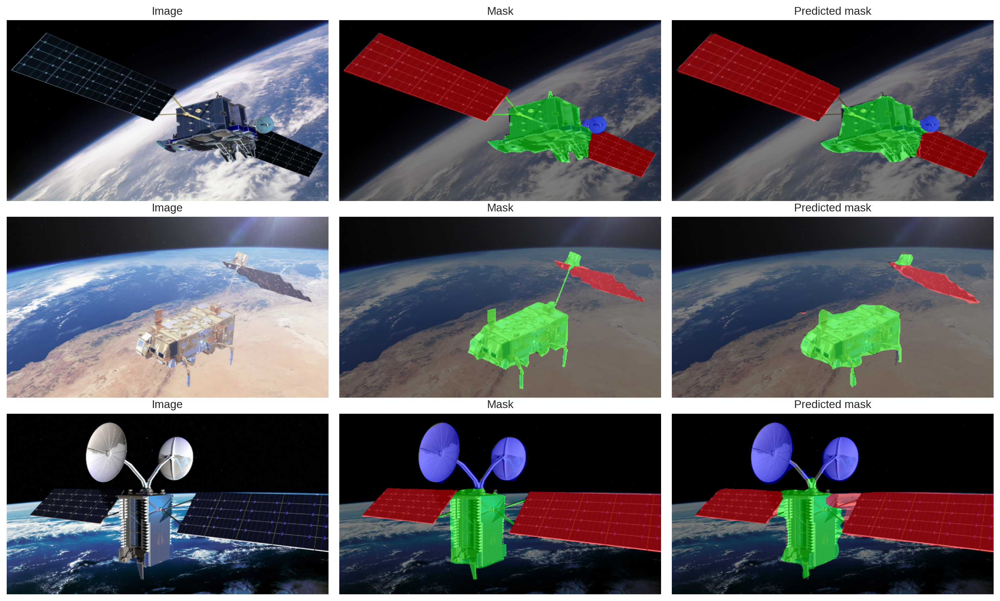

In [ ]:
display_random_examples(valid_dataset, 3, pl_model)

## Выводы

- выполнен анализ исходного датасета, визуализированы данные
- была обучена модель Instance Segmentation (DeepLabV3)
- mIOU > 0.7 на валидационной выборке
- результаты работы обученной модели визуализированы

In [4]:
!pip freeze > requirements.txt